In [23]:
# Plane (Ticket) Price Prediction Project - Hairan Liang

# Load in the dataset

import csv

data = open('/Users/hairanliang/Downloads/LAXDepartures.csv')

In [24]:
import pandas as pd

df = pd.read_csv(data)

pd.set_option('display.max_rows', None)
pd.set_option('max_columns', None)

In [98]:
df.tail(500)

,searchDate,flightDate,startingAirport,destinationAirport,fareBasisCode,travelDuration,elapsedDays,isBasicEconomy,isRefundable,isNonStop,baseFare,totalFare,seatsRemaining,totalTravelDistance,segmentsDepartureTimeRaw,segmentsArrivalTimeRaw,segmentsArrivalAirportCode,segmentsDepartureAirportCode,segmentsAirlineName,segmentsAirlineCode,segmentsEquipmentDescription,segmentsDurationInSeconds,segmentsDistance,segmentsCabinCode
8072781,2022-10-05,2022-11-11,LAX,IAD,LAA2AQBN,PT8H58M,0,True,False,False,143.26,177.61,9,2586.0,2022-11-11T10:23:00.000-08:00||2022-11-11T18:2...,2022-11-11T15:40:00.000-06:00||2022-11-11T22:2...,IAH||IAD,LAX||IAH,United||United,UA||UA,Boeing 737 MAX 9||Boeing 737-800,11820||10440,1383||1203,coach||coach
8072782,2022-10-05,2022-11-11,LAX,IAD,KAA2AWBN,PT10H6M,1,True,False,False,139.54,179.21,9,2348.0,2022-11-11T22:38:00.000-08:00||2022-11-12T10:3...,2022-11-12T06:04:00.000-05:00||2022-11-12T11:4...,CLE||IAD,LAX||CLE,United||United,UA||UA,Boeing 737 MAX 9||Boeing 737-900,15960||4140,2048||300,coach||coach
8072783,2022-10-05,2022-11-11,LAX,IAD,NUAKZNB3,PT7H4M,0,True,False,False,147.91,181.10,7,2448.0,2022-11-11T11:30:00.000-08:00||2022-11-11T20:1...,2022-11-11T19:08:00.000-05:00||2022-11-11T21:3...,CLT||IAD,LAX||CLT,American Airlines||American Airlines,AA||AA,Airbus A321||Airbus A321,16680||4740,2121||327,coach||coach
8072784,2022-10-05,2022-11-11,LAX,IAD,NH2OASBN,PT4H54M,0,True,False,True,161.86,188.60,7,2295.0,2022-11-11T08:40:00.000-08:00,2022-11-11T16:34:00.000-05:00,IAD,LAX,Alaska Airlines,AS,Airbus A320,17640,2295,coach
8072785,2022-10-05,2022-11-11,LAX,IAD,TAUNA0BC,PT7H15M,0,True,False,False,166.51,202.60,9,2452.0,2022-11-11T13:13:00.000-08:00||2022-11-11T19:5...,2022-11-11T18:50:00.000-06:00||2022-11-11T23:2...,MSP||IAD,LAX||MSP,Delta||Delta,DL||DL,Airbus A321||Canadian Regional Jet 700,13020||8940,1534||918,coach||coach
8072786,2022-10-05,2022-11-11,LAX,IAD,TAUNA0BC,PT8H31M,0,True,False,False,166.51,202.60,9,2452.0,2022-11-11T11:57:00.000-08:00||2022-11-11T19:5...,2022-11-11T17:35:00.000-06:00||2022-11-11T23:2...,MSP||IAD,LAX||MSP,Delta||Delta,DL||DL,Airbus A321||Canadian Regional Jet 700,13080||8940,1534||918,coach||coach
8072787,2022-10-05,2022-11-11,LAX,IAD,TAUNA0BC,PT8H43M,1,True,False,False,166.51,202.60,9,2484.0,2022-11-11T12:55:00.000-08:00||2022-11-11T22:5...,2022-11-11T20:09:00.000-05:00||2022-11-12T00:3...,ATL||IAD,LAX||ATL,Delta||Delta,DL||DL,Boeing 757||Airbus A320,15240||6060,1943||541,coach||coach
8072788,2022-10-05,2022-11-11,LAX,IAD,TAUNA0BC,PT9H30M,1,True,False,False,166.51,202.60,9,3268.0,2022-11-11T17:52:00.000-08:00||2022-11-11T22:3...,2022-11-11T20:35:00.000-08:00||2022-11-12T06:2...,SEA||IAD,LAX||SEA,Delta||Delta,DL||DL,Boeing 737-900||Boeing 737-800,9780||17400,956||2312,coach||coach
8072789,2022-10-05,2022-11-11,LAX,IAD,TAA2OQBN,PT4H49M,1,True,False,True,180.47,208.61,9,2295.0,2022-11-11T23:40:00.000-08:00,2022-11-12T07:29:00.000-05:00,IAD,LAX,United,UA,Boeing 737-900,17340,2295,coach
8072790,2022-10-05,2022-11-11,LAX,IAD,TAA2OQBN,PT7H28M,0,True,False,False,180.47,217.61,9,2339.0,2022-11-11T05:30:00.000-08:00||2022-11-11T13:0...,2022-11-11T11:34:00.000-06:00||2022-11-11T15:5...,ORD||IAD,LAX||ORD,United||United,UA||UA,Boeing 737 MAX 9||Airbus A320,14640||6780,1745||594,coach||coach


In [5]:
# Simple question: How does price vary when it is nonStop vs nonNonStop, or Refundable vs NonRefundable. then look 
# at seatsRemaining and get average price depending on seats remaining

# nonStop vs not NonStop

nonStopSeries = pd.Series(df['isNonStop'].values)
nonStopSeries.head(25)


0     False
1      True
2      True
3     False
4     False
5     False
6     False
7     False
8     False
9     False
10    False
11    False
12    False
13    False
14    False
15    False
16    False
17    False
18    False
19    False
20    False
21    False
22    False
23    False
24    False
dtype: bool

In [6]:
totalFareSeries = pd.Series(df['totalFare'].values)

In [7]:
nonStopTotalFare = totalFareSeries[nonStopSeries]
nonStopTotalFare.head(25)

1      328.59
2      328.59
52     498.60
53     498.60
54     498.60
64     598.61
65     598.61
66     598.61
67     598.61
68     598.61
69     598.61
70     598.61
71     598.61
72     598.61
73     598.61
74     598.61
75     598.61
107    353.60
108    353.60
109    353.60
110    353.60
111    353.60
112    353.60
113    353.60
114    353.60
dtype: float64

In [8]:
averageTotalFareNonStop = sum(x for x in nonStopTotalFare) / len(nonStopTotalFare) 
averageTotalFareNonStop

329.1447372430767

In [9]:
notNonStopSeries = ~nonStopSeries

In [10]:
notNonStopSeries.head(25)

0      True
1     False
2     False
3      True
4      True
5      True
6      True
7      True
8      True
9      True
10     True
11     True
12     True
13     True
14     True
15     True
16     True
17     True
18     True
19     True
20     True
21     True
22     True
23     True
24     True
dtype: bool

In [11]:
notNonStopTotalFare = totalFareSeries[notNonStopSeries]
notNonStopTotalFare.head(25)

0     253.99
3     335.61
4     357.60
5     357.60
6     357.60
7     357.60
8     357.60
9     357.60
10    357.60
11    369.10
12    369.10
13    369.10
14    370.60
15    370.60
16    370.60
17    370.60
18    370.60
19    370.60
20    370.60
21    370.60
22    370.60
23    370.60
24    370.60
25    370.60
26    370.60
dtype: float64

In [12]:
averageTotalFareNotNonStop = sum(x for x in notNonStopTotalFare) / len(notNonStopTotalFare) 
averageTotalFareNotNonStop # Somehow, when it's nonstop, it costs less on average (329.1447372430767) compared to 
# when it's not nonstop (394.85995530713365)

394.85995530713365

In [13]:
# I will now check why this is the case: maybe flights that can be nonstop are inherently closer in distance and thus 
# will cost less? Maybe there are significantly more flights that fall under nonstop or notNonstop.

len(notNonStopTotalFare) 

6156165

In [14]:
len(nonStopTotalFare) 

1917116

In [94]:
# Now, I will look at how different airlines have different average prices for only NONSTOP flights

# Creating a series for segmentsAirlineName

segmentsAirlineNameSeries = pd.Series(df['segmentsAirlineName'].values)

deltaBool = segmentsAirlineNameSeries.str.contains("Delta")
nonstopDelta = nonStopSeries & deltaBool

spiritAirlinesBool = segmentsAirlineNameSeries.str.contains("Spirit Airlines")
nonstopSpiritAirlines = nonStopSeries & spiritAirlinesBool

americanAirlinesBool = segmentsAirlineNameSeries.str.contains("American Airlines")
nonstopAmericanAirlines = nonStopSeries & americanAirlinesBool

alaskaAirlinesBool = segmentsAirlineNameSeries.str.contains("Alaska Airlines")
nonstopAlaskaAirlines = nonStopSeries & alaskaAirlinesBool

jetBlueBool = segmentsAirlineNameSeries.str.contains("JetBlue")
nonstopJetBlue = nonStopSeries & jetBlueBool

unitedBool = segmentsAirlineNameSeries.str.contains("United")
nonstopUnited = nonStopSeries & unitedBool

In [81]:
nonStopDelta[64]

True

In [96]:
FareDeltaNonstop = totalFareSeries[nonstopDelta]
FareSpiritAirlinesNonstop = totalFareSeries[nonstopSpiritAirlines]
FareAmericanAirlinesNonstop = totalFareSeries[nonstopAmericanAirlines]
FareAlaskaAirlinesNonstop = totalFareSeries[nonstopAlaskaAirlines]
FareJetBlueNonstop = totalFareSeries[nonstopJetBlue]
FareUnitedNonstop = totalFareSeries[nonstopUnited]


In [63]:
FareDeltaNonstop

52          498.60
53          498.60
54          498.60
64          598.61
65          598.61
66          598.61
67          598.61
68          598.61
69          598.61
70          598.61
71          598.61
72          598.61
73          598.61
110         353.60
111         353.60
116         353.60
121         353.60
230         238.60
231         238.60
273         378.60
296         296.61
299         296.61
403         548.60
404         548.60
405         548.60
406         548.60
407         548.60
408         548.60
532         361.60
533         361.60
534         361.60
535         361.60
536         361.60
537         361.60
538         361.60
539         361.60
749         248.60
750         248.60
751         248.60
861         164.60
863         164.60
876         248.60
877         248.60
884         328.60
885         328.60
886         328.60
913         498.60
914         498.60
929         578.60
930         598.61
931         598.61
932         598.61
933         

In [99]:
averageFareDeltaNonStop = sum(x for x in FareDeltaNonstop) / len(FareDeltaNonstop) 
averageFareSpiritAirlinesNonStop = sum(x for x in FareSpiritAirlinesNonstop) / len(FareSpiritAirlinesNonstop) 
averageFareAmericanAirlinesNonStop = sum(x for x in FareAmericanAirlinesNonstop) / len(FareAmericanAirlinesNonstop) 
averageFareAlaskaAirlinesNonStop = sum(x for x in FareAlaskaAirlinesNonstop) / len(FareAlaskaAirlinesNonstop) 
averageFareJetBlueNonStop = sum(x for x in FareJetBlueNonstop) / len(FareJetBlueNonstop) 
averageFareUnitedNonStop = sum(x for x in FareUnitedNonstop) / len(FareUnitedNonstop) 

In [84]:
averageFareDeltaNonStop

357.2665760318397

In [93]:
averageFareSpiritAirlinesNonStop # Can look at how Spirit Airlines varies in its distance travelled (Maybe some
# airlines just travel shorter distances, leading to lower prices)

180.24313516400989

In [86]:
averageFareAmericanAirlinesNonStop

395.0994012055027

In [87]:
averageFareAlaskaAirlinesNonStop

220.70216149259915

In [88]:
averageFareJetBlueNonStop

360.57761070444406

In [92]:
averageFareUnitedNonStop

275.48213136664316

In [100]:
names = ["Delta", "Spirit Airlines", "American Airlines", "Alaska Airlines", "Jet Blue", "United"]
prices = [averageFareDeltaNonStop, averageFareSpiritAirlinesNonStop, averageFareAmericanAirlinesNonStop, 
         averageFareAlaskaAirlinesNonStop, averageFareJetBlueNonStop, averageFareUnitedNonStop]

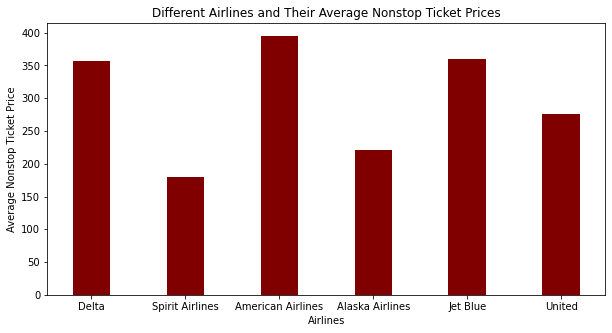

In [112]:
import matplotlib.pyplot as plt

airlinesDict = {"Airline": names, "Prices": prices}

fig = plt.figure(figsize = (10, 5))
plt.bar(names, prices, color = 'maroon', width = 0.4)
plt.xlabel("Airlines")
plt.ylabel("Average Nonstop Ticket Price")
plt.title("Different Airlines and Their Average Nonstop Ticket Prices")
plt.show()

In [ ]:
# Now, I want a scatterplot of distance travelled and Average Ticket Price
# First, I'll have to get rid of some NaN values, either by averaging 
# and filling them with the average, or just not considering them.